# IMDb Movie Network - Explainer Notebook Group 55
This notebook contains the technical details of our analysis.

Firstly we import necessary packages and set some parameters.

In [ ]:
import pickle
import networkx as nx
import pandas as pd
import re, time, requests
from bs4 import BeautifulSoup
%pip install langdetect
from langdetect import detect, LangDetectException
import random
import nltk
import math, numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from collections import Counter, defaultdict
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
import seaborn as sns

seed = 42 # Ensures consistent plots etc.
random.seed(seed)

# Flag to download or create the graph from a local file
download = True	  # Set to true as graph has been created and uploaded
graph_url = "https://github.com/SorenLKuhl/imdb_network/raw/refs/heads/main/imdb_movie_network.pkl"
mapping_url = "https://github.com/SorenLKuhl/imdb_network/raw/refs/heads/main/actor_id_to_name.pkl"

## Creating the network
To extract our network, we have created a github repository with a pickle. This way we can share the network directly in the notebook.

In [ ]:
G: nx.Graph = nx.Graph()	# Undirected as links are actors in common
if download:
	# Download the pickled graph from GitHub
	response = requests.get(graph_url)
	response.raise_for_status()  # Ensure we got a successful response
	G = pickle.loads(response.content)
	G = G.copy()  # To make the graph writable
else:
  ## THIS CODE WONT RUN BUT IS INCLUDED TO SHOW HOW THE GRAPH IS CREATED ##
  path = "../datasets/final_filtered_movies_with_reviews.tsv"
  movies_df = pd.read_csv(path, sep="\t")

  # Create mapping of actors to movies
  actor_to_movies = {}

  for idx, row in movies_df.iterrows():

    # Add movie as node with attributes
    id = row['tconst']
    title = row['primaryTitle']
    original_title = row['originalTitle']
    avg_rating = row['averageRating']
    num_ratings = row['numVotes']
    actors = row['nconst'].split(', ') if 'nconst' in row and pd.notna(row['nconst']) else []
    reviews = row['top20_reviews_en'].split('|||') if 'top20_reviews_en' in row and pd.notna(row['top20_reviews_en']) else []
    genres = row['genres'].split(', ') if 'genres' in row and pd.notna(row['genres']) else []
    G.add_node(id, title=title, original_title=original_title, avg_rating=avg_rating, num_ratings=num_ratings, reviews=reviews, genres=genres, actors=actors)

    # Map actors to movies
    for actor in actors:
      if actor not in actor_to_movies:
        actor_to_movies[actor] = []
      actor_to_movies[actor].append(id)

  # Add edges based on shared actors
  for actor, movies in actor_to_movies.items():
    for i in range(len(movies)):
      for j in range(i + 1, len(movies)):
        # check if edge already exists, if so, append actor to list
        if G.has_edge(movies[i], movies[j]):
          G[movies[i]][movies[j]]['actors'].append(actor)
          G[movies[i]][movies[j]]['weight'] = len(G[movies[i]][movies[j]]['actors'])
        else:
          G.add_edge(movies[i], movies[j], actors=[actor], weight=1)

# Display basic info about the graph - should have num of node = num of movies
print(G)

Graph with 1740 nodes and 3373 edges


We then prune the edges to only include those with a weight of >=2, extract the giant connected component and pickle the G in the case we want to upload it to github.

In [ ]:
if not download:
  ## THIS CODE WONT RUN BUT IS INCLUDED TO SHOW HOW THE PRUNING IS DONE ##
  # Remove edges with weight less than a threshold
  threshold = 2
  edges_to_remove = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] < threshold]
  G.remove_edges_from(edges_to_remove)
  # Remove isolated nodes
  isolated_nodes = list(nx.isolates(G))
  G.remove_nodes_from(isolated_nodes)
  # Extract GCC
  cc = sorted(nx.connected_components(G), key=len, reverse=True)
  G = G.subgraph(cc[0])
  # Pickle
  pickle_path = "imdb_movie_network.pkl"
  with open(pickle_path, 'wb') as f:
    pickle.dump(G, f)

Below is an example of a node. A node in our network consists of a title, original_title, avg_rating, num_ratings, reviews, genres and actors.

In [ ]:
G.nodes['tt0031381']

{'title': 'Gone with the Wind',
 'original_title': 'Gone with the Wind',
 'avg_rating': 8.2,
 'num_ratings': 351677,
 'reviews': ["Ungodly movie. The entire thing is from the view of people that don't know Lord Jesus. Then last hour is just the road to hell and death. It's a sick, unclean, pile of filth.",
  'A beautiful tale of an unlikable, privileged and self absorbed young woman, who, through hardship and loss, learns valuable lessons and comes to look at life in a new way.',
  'Rhett Butler, businessman and acknowledged scoundrel, meets and falls for the lovely young Scarlett O’Hara, heir to a Georgia plantation and well-known heartbreaker. They do a choreographed little dance at public functions, pretending to be affronted and then deftly dismissing each other to maintain dignity, but their true feelings are clear. He really cares for her, sees her as a wild mare to be tamed and treasured, while she considers him nothing more than a promising, wealthy candidate for her next oppor

We now load the mapping of actor_id_to_name in the same manner

In [ ]:
actor_id_to_name = {}
if not download:
    ## THIS CODE WONT RUN BUT IS INCLUDED TO SHOW HOW THE MAPPING IS CREATED ##
    print("Creating actor ID to name mapping from local dataset...")
    actors_path = "../datasets/name.basics.tsv"
    actors_df = pd.read_csv(actors_path, sep="\t")
    print(f"Number of actors before pruning: {len(actors_df)}")
    # Prune to only needed columns
    actors_df = actors_df[['nconst', 'primaryName']]
    # prune to only actors in our graph
    actors = actor_to_movies.keys()
    actors_df = actors_df[actors_df['nconst'].isin(actors)]
    print(f"Number of actors after pruning: {len(actors_df)}")
    # Create mapping of actor ID to actor name
    for idx, row in actors_df.iterrows():
        actor_id_to_name[row['nconst']] = row['primaryName']
    # pickle the actor_id_to_name mapping for later use
    with open("actor_id_to_name.pkl", "wb") as f:
        pickle.dump(actor_id_to_name, f)
    print(actors_df.head())
else:
    print("Downloading actor ID to name mapping from GitHub...")
    response = requests.get(mapping_url)
    response.raise_for_status()
    actor_id_to_name = pickle.loads(response.content)

We now find some summary stats about the network. See Figure 1.

Number of nodes (movies): 1740
Number of edges (links between movies): 3373
Number of unique actors linking movies: 91068
Average degree: 3.8770114942528737
Average rating: 6.953735632183908
Assortativity with regards to rating: 0.013752105338524792


Text(0.5, 1.0, 'Degree distribution of the IMDb movie network')

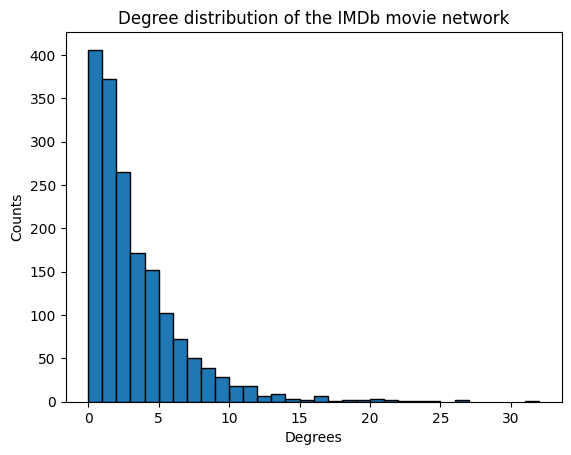

In [ ]:
# Summary stats about the network
print(f"Number of nodes (movies): {G.number_of_nodes()}")
print(f"Number of edges (links between movies): {G.number_of_edges()}")
print(f"Number of unique actors linking movies: {len(actor_id_to_name)}")
print(f"Average degree: {np.mean([d for n, d in G.degree()])}")
print(f"Average rating: {np.mean([G.nodes[n]['avg_rating'] for n in G.nodes])}")
print(f"Assortativity with regards to rating: {nx.attribute_assortativity_coefficient(G, "avg_rating")}")

# Degree distribution
degree_dict = {}

for node in G.nodes():
    degree_dict[G.degree(node)] = degree_dict.get(G.degree(node), 0) + 1

plt.bar(degree_dict.keys(), degree_dict.values(), width=-1, align="edge", edgecolor='black')
plt.xlabel('Degrees')
plt.ylabel('Counts')
plt.title('Degree distribution of the IMDb movie network')

###Figure 1: Degree distrubition of the IMDb movie network

And showing it in a log-log plot in Figure 2:

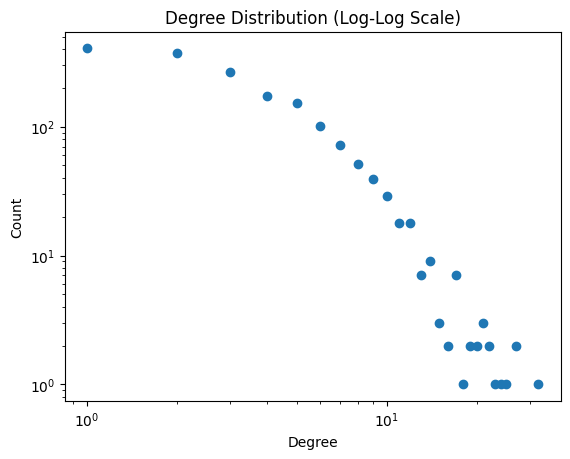

In [ ]:
# Log-log plot
degrees = np.array(list(degree_dict.keys()))
counts = np.array(list(degree_dict.values()))
plt.figure()
plt.loglog(degrees, counts, marker='o', linestyle='None')
plt.xlabel("Degree")
plt.ylabel("Count")
plt.title("Degree Distribution (Log-Log Scale)")
plt.show()

### Figure 2: Log-log plot of the degree distribution of the IMDb dataset

In [ ]:
# Highest degree nodes
sorted_degrees = sorted(G.degree(), key=lambda x: x[1], reverse=True)
print("Top 10 movies by degree:")
for movie_id, degree in sorted_degrees[:10]:
	print(f"{G.nodes[movie_id]['title']} (Degree: {degree})")

Top 10 movies by degree:
Avengers: Endgame (Degree: 32)
Spider-Man: No Way Home (Degree: 27)
The Dark Knight Rises (Degree: 27)
Goodfellas (Degree: 25)
Forrest Gump (Degree: 24)
The Dark Knight (Degree: 23)
Fight Club (Degree: 22)
X-Men: Days of Future Past (Degree: 22)
Mulan (Degree: 21)
Batman Begins (Degree: 21)


We now visualize the network in Figure 3:

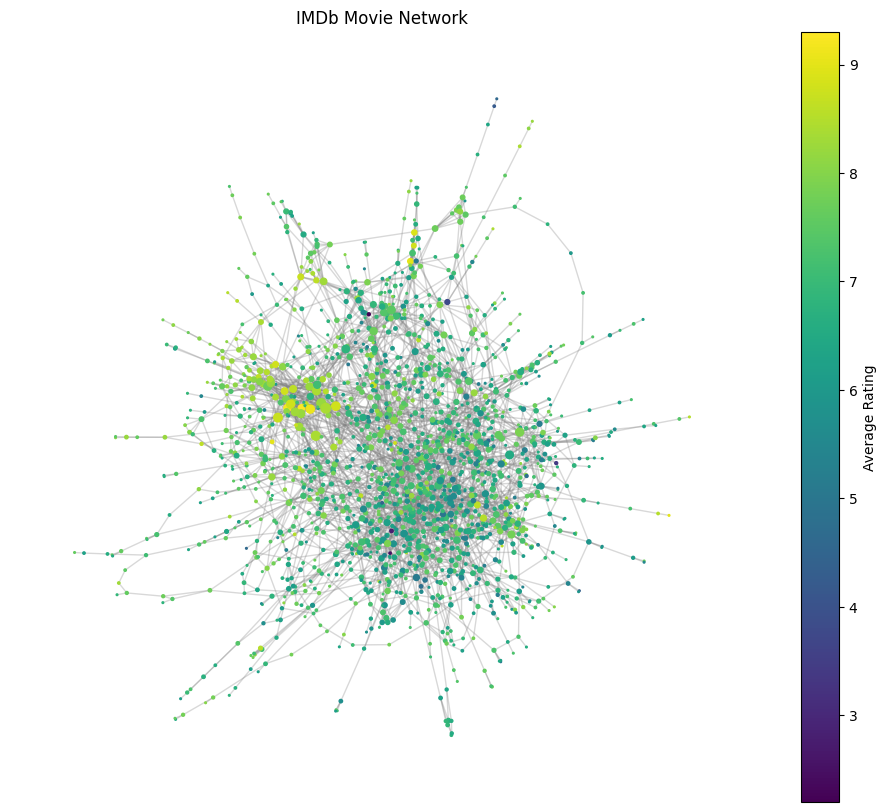

In [ ]:
# Layout
pos = nx.forceatlas2_layout(G, max_iter=500, jitter_tolerance=0.2, scaling_ratio=1.0, gravity=1.0, seed=seed)

# Node sizing based on degree
deg = dict(G.degree())
node_sizes = [deg[n]*1.5 for n in G.nodes()]

# Color based on average rating
ratings = [G.nodes[n]['avg_rating'] for n in G.nodes()]

plt.figure(figsize=(12, 10))
nodes = nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=ratings, cmap=plt.cm.viridis)
edges = nx.draw_networkx_edges(G, pos, alpha=0.3, edge_color='gray')
plt.colorbar(nodes, label='Average Rating')
plt.title("IMDb Movie Network")
plt.axis("off")
plt.show()

### Figure 3: IMDb movie network show with NetworkX' draw tool

## Communities and Modularity
To get a better understanding of the network and its structure, we create two different community partitions. One is based on the structural communities of the network (see Figure 4). This is done using Louvain's algorithm for structural community detection. The other partition is based on the genres of the movies (see Figure 5). Here, each movie is assigned to a community based on a random selection of one of its genres. This is necessary since the genres of each movie is provided in alphabetical order.

/tmp/ipython-input-832129655.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis', len(communities))


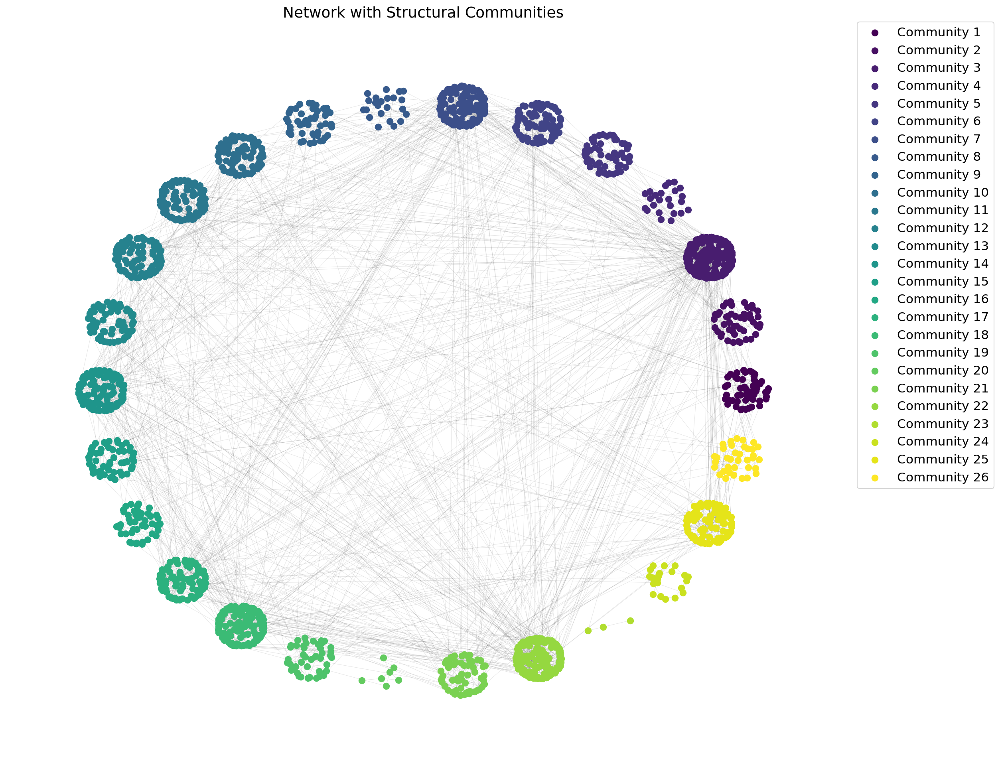

In [ ]:
communities = nx.algorithms.community.louvain_communities(G, resolution=0.7, seed=42)

cmap = cm.get_cmap('viridis', len(communities))
pos = {}

offset_scale = 14
node_spacing = 1.6

for i, community in enumerate(communities):
    subG = G.subgraph(community)
    sub_pos = nx.spring_layout(subG, seed=42, k=node_spacing)

    angle = 2 * np.pi * i / len(communities)
    offset = np.array([np.cos(angle), np.sin(angle)]) * offset_scale

    for node, p in sub_pos.items():
        pos[node] = p + offset

plt.figure(figsize=(18, 16), dpi=150)

for i, community in enumerate(communities):
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=community,
        node_color=[cmap(i)],
        label=f'Community {i+1}',
        node_size=70,
        linewidths=0
    )

nx.draw_networkx_edges(
    G, pos,
    alpha=0.1,
    edge_color='black',
    width=0.5
)

plt.title("Network with Structural Communities", fontsize=18)
plt.axis('off')

plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc='upper left',
    borderaxespad=0.,
    fontsize=15
)

plt.show()

## Figure 4: Structural communities using Louvains algorithm

/tmp/ipython-input-2038652713.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(genre_communities))


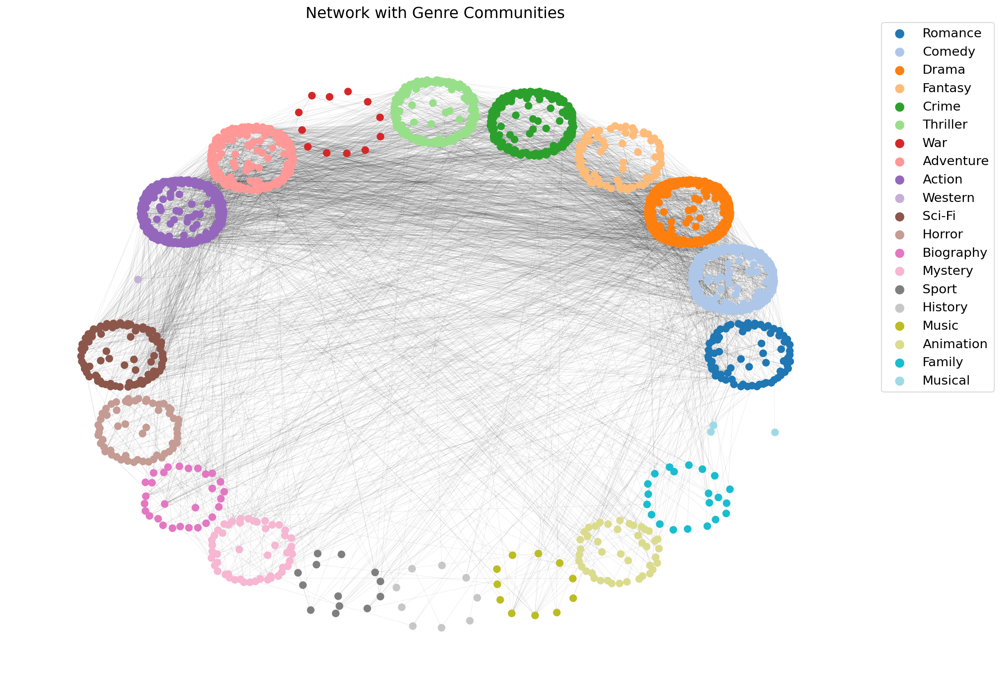

In [ ]:
for n,d in G.nodes(data=True):
    gs = d.get("genres")
    d["genre"] = random.choice(gs[0].split(",")) if gs else None

part = defaultdict(list)
for n,d in G.nodes(data=True):
    g = d.get("genre")
    if g: part[g].append(n)

genres = list(part.keys())
genre_communities = [part[g] for g in genres]

cmap = cm.get_cmap('tab20', len(genre_communities))

# --- Improved layout parameters ---
pos = {}
offset_scale = 7.5   # was 2.5 → spreads genre_communities further apart
node_spacing = 1.4   # was 0.8 → spreads nodes inside genre_communities

for i, community in enumerate(genre_communities):
    subG = G.subgraph(community)

    # better intra-community spacing
    sub_pos = nx.spring_layout(subG, seed=42, k=node_spacing)

    # place genre_communities in a clean circle
    angle = 2 * np.pi * i / len(genre_communities)
    offset = np.array([np.cos(angle), np.sin(angle)]) * offset_scale

    for node, p in sub_pos.items():
        pos[node] = p + offset

# --- Plot ---
plt.figure(figsize=(18, 14), dpi=150)

for i, community in enumerate(genre_communities):
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=community,
        node_color=[cmap(i)],
        label=genres[i],
        node_size=80,
        linewidths=0
    )

# Much lighter edges to reduce visual noise
nx.draw_networkx_edges(
    G, pos,
    alpha=0.10,
    edge_color='black',
    width=0.4
)

plt.title("Network with Genre Communities", fontsize=18)
plt.axis('off')

# Move legend outside the plot
plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    borderaxespad=0,
    fontsize=15,
    markerscale=1.2
)

plt.show()

### Figure 5: Communities based on movie genres

From the community plots of the two partition methods we observe that the genre based partitions find significantly fewer communities than the structural communties based on Louvain's method. Further, it can be seen that the genre based communities appear to have more links that are between communities, indicating that the modularity of this partitioning is lower than that of the Louvain method. To further investigate this, we compute the modularity of the genre based communities and the Louvain communities below.

In [ ]:
L = G.number_of_edges()
modularity = 0.0
for community in genre_communities:
    G_sub = G.subgraph(community)
    Lc = G_sub.number_of_edges()
    kc = sum(dict(G_sub.degree()).values())
    modularity += (Lc / L) - (kc / (2 * L)**2)

print(f"Modularity of the communities based on genres: '{modularity:.3f}'")

Modularity of the communities based on genres: '0.201'


In [ ]:
L = G.number_of_edges()
modularity = 0.0
for community in communities:
    G_sub = G.subgraph(community)
    Lc = G_sub.number_of_edges()
    kc = sum(dict(G_sub.degree()).values())
    modularity += (Lc / L) - (kc / (2 * L)**2)

print(f"Modularity of structural communities: '{modularity:.3f}'")

Modularity of structural communities: '0.787'


This is confirmed by the significantly higher modulariry score of the structural communities. This tells us that the genres describe of suboptimal partition of communities, meaning that they fail to identify the communities in the network.

To get an idea of the impact of genres we compute a confusion matrix of the seven largest structural communities with the seven most occuring genres (see Figure 6). It should be noted that we here look at all the genres of each movie and not just the one.

In [ ]:
# count top 7 most common genres in the network
genre_counts = defaultdict(int)
for n,d in G.nodes(data=True):
    gs = d.get("genres")
    if gs:
        genres_split = gs[0].split(',')
        for genre in genres_split:
            genre_counts[genre] += 1
top_7_genres = sorted(genre_counts, key=genre_counts.get, reverse=True)[:7]

# top 7 structural communities by size
community_sizes = [(i, len(community)) for i, community in enumerate(communities)]
community_sizes.sort(key=lambda x: x[1], reverse=True)
top_7_communities = [i for i, _ in community_sizes[:7]]

In [ ]:
louvain_partition = {}
for i, comm in enumerate(communities):
    for node in comm:
        louvain_partition[node] = i

D = np.zeros((7, 7), dtype=int)
for movie in G.nodes():
    if louvain_partition[movie] in top_7_communities:
        comm_idx = top_7_communities.index(louvain_partition[movie])
        movie_genres = G.nodes[movie].get("genre")
        if movie_genres in top_7_genres:
            D[top_7_genres.index(movie_genres), comm_idx] += 1

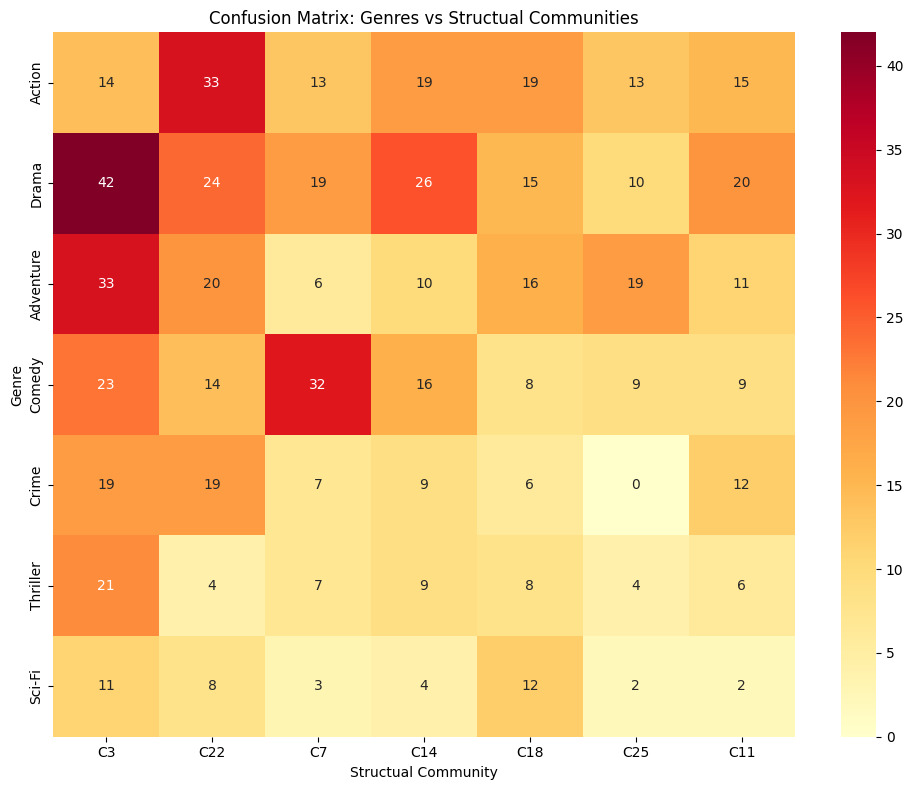

In [ ]:
df = pd.DataFrame(D, index=top_7_genres, columns=[f'C{i+1}' for i in top_7_communities])

plt.figure(figsize=(10, 8))
sns.heatmap(df, annot=True, fmt='d', cmap='YlOrRd')
plt.title('Confusion Matrix: Genres vs Structual Communities')
plt.xlabel('Structual Community')
plt.ylabel('Genre')
plt.tight_layout()
plt.show()

## Figure 6: Confusion matrix of structural communities and genre based communities

From this confusion matrix, we can see some tendencies of specific genres be more represented in different structural communities. However, it can also be seen that, while there are some genres being represented more than other, there is in general a fairly wide representation of genres.

## Web-scraping the reviews
To extract reviews from Metacritic, we first had to understand how the site’s URLs work. That meant adjusting titles from our IMDb dataset to match Metacritic’s format. For example, spaces in an IMDb title become “-” in the Metacritic URL. We also limited the scraper to English-language reviews only, since focusing on one language made the sentiment analysis more reliable and easier to interpret.

Additionally, we had to handle duplicate reviews. We noticed that when a page had only a few reviews, our scraper sometimes visited the same page multiple times to reach the 20-review target, which produced repeats. To prevent duplicates from skewing sentiment scores, we added duplicate detection so we only kept unique reviews.

Finally, we added a time-out. The scraper only searches for a few seconds per movie before stopping, because in some cases the program would hang or crash if a page was too slow to response.

In [ ]:
# The full code with every movie takes approx. 70 min to run, so we have shorten it down to just do 3 movies from the dataset just to show the approach.
# pip install langdetect in order to make this work.
def title_to_url_slug(title):
    slug = re.sub(r'[^\w\s-]', '', title.lower())
    slug = re.sub(r'\s+', '-', slug)
    return slug.strip('-')

def fetch_en_reviews(title, n=20, max_sec=20, max_pages=10):
    h={"User-Agent":"Mozilla/5.0"}
    out = []
    seen_reviews = set()  # Track unique reviews
    page = 0
    t0 = time.time()
    slug = title_to_url_slug(title)

    while len(out) < n and page < max_pages:
        if time.time() - t0 > max_sec:
            return out, "TOO_SLOW"

        url = f"https://www.metacritic.com/movie/{slug}/user-reviews/" + ("" if page == 0 else f"?page={page}")

        try:
            response = requests.get(url, headers=h, timeout=10)
            if slug not in response.url:
                print(f"  Warning: Redirected from {slug} to {response.url}")
                break
            soup = BeautifulSoup(response.text, "html.parser")
        except requests.RequestException:
            return out, "TIMEOUT"

        qs = soup.find_all("div", class_="c-siteReview_quote")
        if not qs:
            break

        new_reviews_on_page = 0
        duplicates_on_page = 0

        for q in qs:
            if time.time() - t0 > max_sec:
                return out, "TOO_SLOW"

            txt = q.get_text(strip=True)

            # Check for duplicates
            if txt in seen_reviews:
                duplicates_on_page += 1
                continue

            try:
                if detect(txt) == "en":
                    out.append(txt)
                    seen_reviews.add(txt)
                    new_reviews_on_page += 1
                    if len(out) == n:
                        break
            except LangDetectException:
                pass

        # Stop if we hit our target or if we only found duplicates
        if len(out) == n or new_reviews_on_page == 0:
            break

        page += 1

    return out, (None if out else "NO_REVIEWS")

def main():
    movies = ["The Kid", "City Lights", "Snow White and the Seven Dwarfs"]

    for idx, title in enumerate(movies, 1):
        print(f"\n{'='*70}")
        print(f"[{idx}/{len(movies)}] Processing: {title}")
        print('='*70)

        reviews, err = fetch_en_reviews(title, 20)

        if err:
            print(f"  Error: {err}")
        else:
            print(f"  ✓ Fetched {len(reviews)} unique English reviews\n")
            for i, review in enumerate(reviews, 1):
                print(f"Review {i}:")
                print(f"{review}\n")

        time.sleep(0.5)

if __name__ == "__main__":
    main()


[1/3] Processing: The Kid
  ✓ Fetched 3 unique English reviews

Review 1:
I love this movie. It has touching moments and a great message for all of us that reminds us to keep alive the kid we all have inside.

Review 2:
This is a wonderful family movie with a lot of funny and warm moments.      Bruce Willis and Spencer Breslin were fantastic.

Review 3:
this movie is so horrible!


[2/3] Processing: City Lights
  ✓ Fetched 14 unique English reviews

Review 1:
Charlie Chaplin falls for a blind flower girl and lives the high life with a lush, amnesiac fatcat, sampling and exploiting various urban lifestyles along the way. Playful and carefree, like all the classic auteur's best pantomimes, this is more of a loosely-related collection of skits than an all-enveloping story. The sidetracks are all great, of course - The Tramp as a late replacement in the boxing ring, all manner of drunken hijinx in a ritzy club on New Year's Eve, slapstick encounters with a newly-unveiled statue before an 

We extract one primary genre for each movie and split the network into genre communities. Because the genre lists are alphabetical, we do not take the first genre. Instead, we pick a random genre from each movie’s genre list (with a fixed seed so results are stable). This avoids over-assigning movies to genres like Action just because they come first alphabetically.

This observation can be seen below as we take a sample of 5 movies with the Action genre.

In [ ]:
count = 0
for mid, d in G.nodes(data=True):
    gs = d.get("genres")
    if not gs:
        continue
    all_genres = gs[0].split(",")
    first = all_genres[0].strip()
    if first == "Action":
        print(mid, "-", d.get("title"))
        print("  all genres:", [g.strip() for g in all_genres])
        count += 1
        if count == 5:
            break

tt0058150 - Goldfinger
  all genres: ['Action', 'Adventure', 'Thriller']
tt0064757 - On Her Majesty's Secret Service
  all genres: ['Action', 'Adventure', 'Thriller']
tt0070328 - Live and Let Die
  all genres: ['Action', 'Adventure', 'Thriller']
tt0071807 - The Man with the Golden Gun
  all genres: ['Action', 'Adventure', 'Thriller']
tt0076752 - The Spy Who Loved Me
  all genres: ['Action', 'Adventure', 'Thriller']


With this approach we get 21 genre groups with different sizes. The largest groups are Drama (312 movies), Comedy (263), Action (235), and Adventure (198). Medium-sized groups include Crime (137), Thriller (121), Sci-Fi (83), Romance (74), and Fantasy (68). Smaller genres are Horror (57), Mystery (50), Animation (43), Biography (29), Family (21), Sport (13), War (12), Music (11), and History (9). The smallest groups are Musical (3) and Western (1).

In [ ]:
for n, d in G.nodes(data=True):
    g = d.get("genres")
    d["genre"] = random.choice(g[0].split(",")) if g else None

partition = {}
for n, d in G.nodes(data=True):
    g = d.get("genre")
    if g:
        partition.setdefault(g, []).append(n)

print(partition.keys())
print(len(partition))
print({k: len(v) for k, v in partition.items()})

dict_keys(['Romance', 'Comedy', 'Adventure', 'Drama', 'Film-Noir', 'Thriller', 'Crime', 'Western', 'Sci-Fi', 'Horror', 'Action', 'Biography', 'War', 'Sport', 'History', 'Fantasy', 'Music', 'Family', 'Mystery', 'Animation', 'Musical'])
21
{'Romance': 76, 'Comedy': 257, 'Adventure': 202, 'Drama': 285, 'Film-Noir': 1, 'Thriller': 122, 'Crime': 114, 'Western': 7, 'Sci-Fi': 93, 'Horror': 57, 'Action': 257, 'Biography': 48, 'War': 10, 'Sport': 18, 'History': 9, 'Fantasy': 69, 'Music': 13, 'Family': 16, 'Mystery': 42, 'Animation': 42, 'Musical': 2}


As an example of how a genre looks like now is shown below with the genre "Animation".

In [ ]:
if 'Animation' in partition:
    print("\n" + "="*30)
    print(f"MOVIES ({len(partition['Animation'])} total)")
    print("="*30)

    for i, movie_id in enumerate(partition['Animation'], 1):
        title = G.nodes[movie_id].get('title', 'Unknown')
        print(f"{i}. {title}")


MOVIES (42 total)
1. Kiki's Delivery Service
2. Porco Rosso
3. The Lion King
4. The Hunchback of Notre Dame
5. Anastasia
6. Princess Mononoke
7. Antz
8. Tarzan
9. Perfect Blue
10. Monsters, Inc.
11. Atlantis: The Lost Empire
12. Cars
13. The Incredibles
14. The Polar Express
15. The SpongeBob SquarePants Movie
16. Happy Feet
17. Tangled
18. A Scanner Darkly
19. Beowulf
20. Puss in Boots
21. Madagascar: Escape 2 Africa
22. Hotel Transylvania
23. Cloudy with a Chance of Meatballs
24. Epic
25. Monsters vs. Aliens
26. Megamind
27. Up
28. Ice Age: Dawn of the Dinosaurs
29. Despicable Me
30. Rio
31. Monsters University
32. Cloudy with a Chance of Meatballs 2
33. Big Hero 6
34. Finding Dory
35. Frozen
36. How to Train Your Dragon: The Hidden World
37. Zootopia
38. Despicable Me 3
39. Cars 3
40. The Boss Baby
41. Spider-Man: Into the Spider-Verse
42. Ralph Breaks the Internet


# Looking at the reviews

First we start the process by extracting the reviews from the network nodes.

In [ ]:
nltk.download('punkt_tab')

genre_tokens = defaultdict(list)

for _, d in G.nodes(data=True):
    if d.get("genres") and d.get("reviews"):
        g = d["genres"][0].split(",")[0]
        text = " ".join(d["reviews"]).lower()
        toks = [w for w in word_tokenize(re.sub(r"[^a-z\s]", " ", text)) if len(w) > 2]
        genre_tokens[g].extend(toks)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In order to look at unique words from the reviews that characterizes each genre, we compute the Term Frequency and the Inverse Document Frequency (TF-IDF)
To calculate TF-IDF, we use the formulas from [Wikipedia](https://en.wikipedia.org/wiki/Tf-idf).

**Term Frequency (TF):**  
$$
TF = \frac{\text{count of word in document}}{\text{total number of words in document}}
$$

**Inverse Document Frequency (IDF):**  
$$
IDF = \log\left(\frac{N}{n_w}\right)
$$

where \( N \) is the total number of documents and \( n_w \) is the number of documents containing the word (df = Counter() creates a dictionary that counts in how many documents each word appears).

To calculate the final TF-IDF score, we multiply **TF** with **IDF**:

$$
TF\text{-}IDF = TF \times IDF
$$

In [ ]:
def calculate_tfidf(doc_tokens):
    df = Counter()
    for tokens in doc_tokens.values():
        for token in set(tokens):
            df[token] += 1

    num_docs = len(doc_tokens)
    tfidf_result = {}

    for label, tokens in doc_tokens.items():
        tf = Counter(tokens)
        total = len(tokens)
        tfidf_scores = {}
        for word, count in tf.items():
            tf_score = count / total
            idf_score = math.log(num_docs / df[word])
            tfidf_scores[word] = tf_score * idf_score
        tfidf_result[label] = tfidf_scores

    return tfidf_result

genre_tfidf = calculate_tfidf(genre_tokens)

Based on the TF-IDF calculations for each genre, we plot WordClouds (see Figure 7) to visualize unique words that characterizes the different genres.

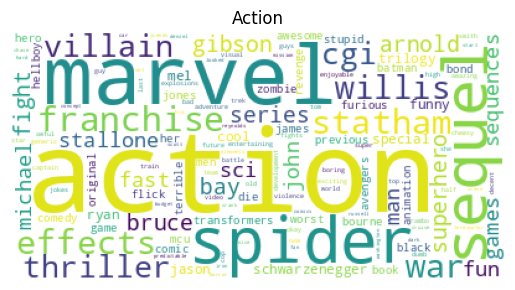

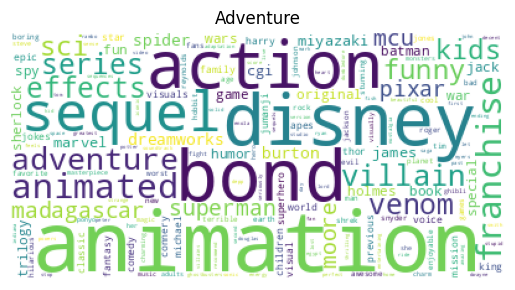

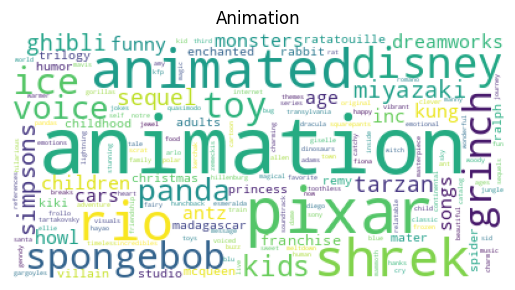

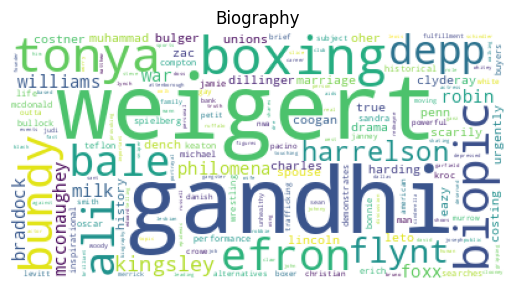

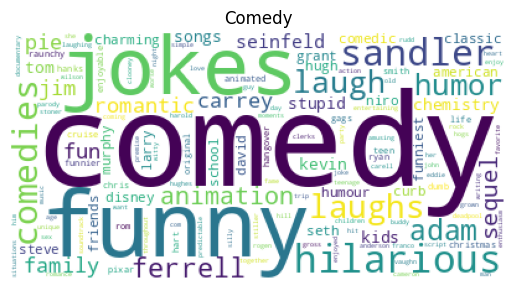

...

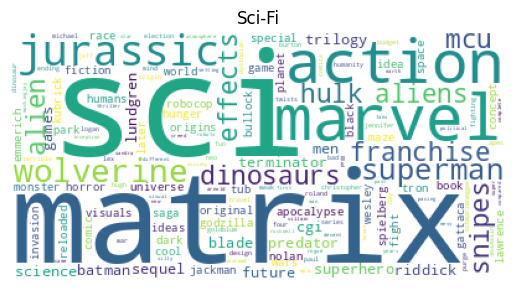

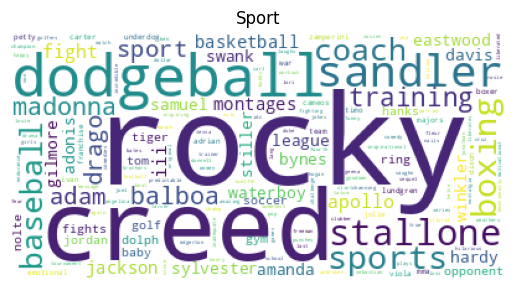

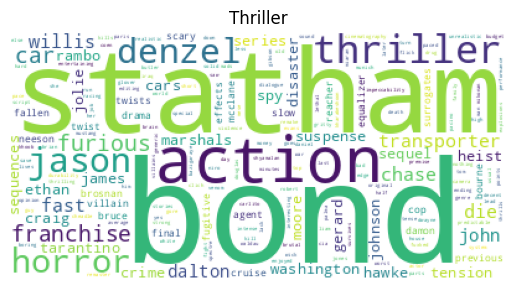

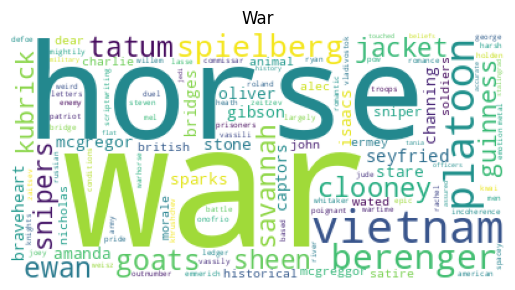

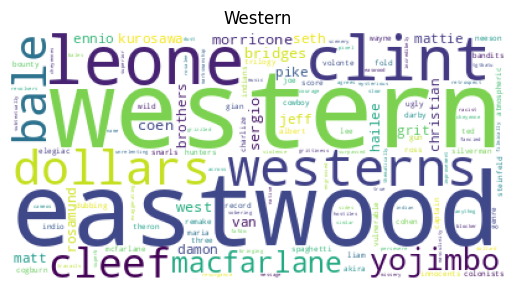

In [ ]:
for n, d in G.nodes(data=True):
    gs = d.get("genres")
    d["genre"] = random.choice(gs[0].split(",")) if gs else None

def unique_words(text):
    seen, out = set(), []
    for w in text.split():
        wl = w.lower()
        if wl not in seen:
            seen.add(wl); out.append(w)
    return " ".join(out)

for _, d in G.nodes(data=True):
    revs = d.get("reviews")
    if revs:
        d["reviews"] = [unique_words(r) for r in revs]

movie_tokens, movie_genres = {}, {}
for mid, d in G.nodes(data=True):
    if d.get("genre") and d.get("reviews"):
        genres = [d["genre"]]
        text = " ".join(d["reviews"]).lower()
        toks = [w for w in word_tokenize(re.sub(r"[^a-z\s]", " ", text)) if len(w) > 2]
        movie_tokens[mid] = toks
        movie_genres[mid] = genres

# 2) TF-IDF per movie
movie_tfidf = calculate_tfidf(movie_tokens)

# 3) average TF-IDF per genre
genre_tfidf = defaultdict(lambda: defaultdict(float))
counts = Counter(gs[0] for gs in movie_genres.values())

for mid, td in movie_tfidf.items():
    for g in movie_genres[mid]:
        for w, s in td.items():
            genre_tfidf[g][w] += s / counts[g]

# 4) wordclouds
for g in sorted(genre_tfidf):
    wc = WordCloud(background_color="white", collocations=False)\
         .generate_from_frequencies(genre_tfidf[g])
    plt.figure(); plt.imshow(wc); plt.axis("off"); plt.title(g); plt.show()


### Figure 7: WordClouds for each movie genre.

# Sentiment across genres and number of ratings

We measure sentiment using the LabMT wordlist that is supplementary material from this paper: https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752. LabMT gives each word a happiness score, so we can estimate how positive or negative a text is.

In [ ]:
def load_labmt():
    labmt_url = "https://raw.githubusercontent.com/SorenLKuhl/RockBandWikiData/refs/heads/main/labMT.txt"
    response = requests.get(labmt_url)
    response.raise_for_status()
    words = {}
    line_count = 0
    for line in response.text.splitlines():
      # Skip first 4 lines
      if line_count < 4:
        line_count += 1
        continue

      # Split line into parts
      parts = line.strip().split('\t')
      if len(parts) >= 3:
        words[parts[0]] = float(parts[2])
    return words

def sentiment(tokens, lex):
    words = [w.lower() for w in tokens if w.lower() in lex]
    return sum(lex[w] for w in words) / len(words) if words else 0.0

lex = load_labmt()
print(f"Sentiment score for joy and happy: {sentiment(['joy', 'happy'], lex)}")

Sentiment score for joy and happy: 8.23


An example of a the sentiment score of the movie "A Fistful of Dollars". Here the example movie has a sentiment score of 5.534112769485904.

In [ ]:
lex = load_labmt()

target = "A Fistful of Dollars"
mid = next(n for n,d in G.nodes(data=True) if d.get("title")==target)

text = " ".join(G.nodes[mid].get("reviews", [])).lower()
tokens = re.findall(r"\w+", text)
print(target, "sentiment:", sentiment(tokens, lex))

A Fistful of Dollars sentiment: 5.534112769485904


For each review, we tokenize it into words, and keep only words that exist in the LabMT list. In order to filter out neutral words, we removed all LabMT words with scores between 4-6, and computed sentiment only from the remaining words. Sentiment scores for each movie in the network can be seen after running the cell below.

In [ ]:
def sentiment(tokens, lex, lens=1.0):
    ws = [w.lower() for w in tokens if w.lower() in lex]
    ws = [w for w in ws if not (5-lens <= lex[w] <= 5+lens)]  # drop neutral words
    return sum(lex[w] for w in ws) / len(ws) if ws else 0.0

lex = load_labmt()
rows = []
scores = []

for mid, d in G.nodes(data=True):
    revs = d.get("reviews")
    if not revs:
        continue
    text = " ".join(revs).lower()
    tokens = re.findall(r"\w+", text)
    score = sentiment(tokens, lex, lens=1.0)
    scores.append(score)
    rows.append((score, d.get("title", mid)))

for score, title in sorted(rows, reverse=True):
    print(f"{title}: {score:.2f}")


Music and Lyrics: 7.01
Get Smart: 6.65
Singin' in the Rain: 6.65
Enchanted: 6.63
Shrek: 6.63
Madagascar: Escape 2 Africa: 6.62
Something's Gotta Give: 6.59
Taking Lives: 6.59
The Proposal: 6.59
The Lego Movie: 6.59
Some Like It Hot: 6.57
Puss in Boots: 6.57
Hitch: 6.57
Rio: 6.57
Jerry Maguire: 6.56
Guardians of the Galaxy: 6.56
The Lion King: 6.56
Long Shot: 6.56
Johnny English: 6.55
Despicable Me: 6.55
Jumanji: Welcome to the Jungle: 6.55
The Prince of Egypt: 6.55
Pitch Perfect: 6.55
Toy Story 2: 6.55
Rat Race: 6.54
Space Jam: 6.54
Midnight Run: 6.54
The Princess Diaries: 6.54
Office Space: 6.54
Coming to America: 6.53
Forgetting Sarah Marshall: 6.53
Maverick: 6.53
Brooklyn: 6.53
School of Rock: 6.52
Almost Famous: 6.52
Game Night: 6.52
Ponyo: 6.52
American Wedding: 6.52
The SpongeBob SquarePants Movie: 6.52
The Departed: 6.52
Shrek 2: 6.51
Paddington: 6.51
The Princess and the Frog: 6.51
Rocketman: 6.51
Sing: 6.51
Bend It Like Beckham: 6.51
Robots: 6.51
Deadpool 2: 6.51
Booksmart: 6.

The histogram in Figure 8 is implemented below. The figure shows the distribution of sentiment across the whole movie network with relevant statistics elements shown in the plot.

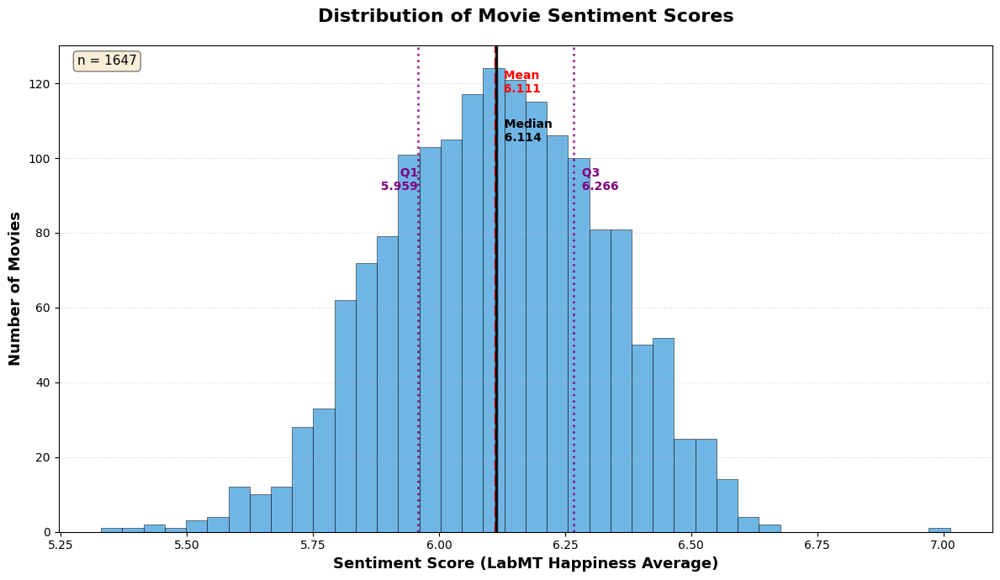

In [ ]:
mean, median = float(np.mean(scores)), float(np.median(scores))
variance = float(np.var(scores))
std = float(np.std(scores))
p25, p75 = float(np.percentile(scores, 25)), float(np.percentile(scores, 75))

plt.figure(figsize=(12, 7))

# Create histogram with better styling
n, bins, patches = plt.hist(scores, bins=40, color='#3498db', alpha=0.7,
                             edgecolor='black', linewidth=0.5)

# Get y-axis limit for label positioning
ymax = plt.ylim()[1]

# Add vertical lines for statistics with labels
plt.axvline(mean, color='red', linestyle='--', linewidth=2.5, alpha=0.9)
plt.text(mean, ymax * 0.95, f'  Mean\n  {mean:.3f}', color='red',
         fontsize=10, fontweight='bold', ha='left', va='top')

plt.axvline(median, color='black', linestyle='-', linewidth=2.5, alpha=0.9)
plt.text(median, ymax * 0.85, f'  Median\n  {median:.3f}', color='black',
         fontsize=10, fontweight='bold', ha='left', va='top')

plt.axvline(p25, color='purple', linestyle=':', linewidth=2, alpha=0.8)
plt.text(p25, ymax * 0.75, f'  Q1\n  {p25:.3f}', color='purple',
         fontsize=10, fontweight='bold', ha='right', va='top')

plt.axvline(p75, color='purple', linestyle=':', linewidth=2, alpha=0.8)
plt.text(p75, ymax * 0.75, f'  Q3\n  {p75:.3f}', color='purple',
         fontsize=10, fontweight='bold', ha='left', va='top')

# Labels and title
plt.title('Distribution of Movie Sentiment Scores',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sentiment Score (LabMT Happiness Average)', fontsize=13, fontweight='bold')
plt.ylabel('Number of Movies', fontsize=13, fontweight='bold')

# Add statistics box
stats_text = f'n = {len(scores)}'
plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

### Figure 8: Distribution of Movie Sentiment Scores.

Now, we also want to show the sentiment across genres in order to look for patterns to explore.  

In [ ]:
def sentiment(tokens, lex, lens=1.0):
    ws = [w.lower() for w in tokens if w.lower() in lex]
    ws = [w for w in ws if not (5-lens <= lex[w] <= 5+lens)]
    return sum(lex[w] for w in ws) / len(ws) if ws else 0.0

genre_scores = defaultdict(list)

for mid, d in G.nodes(data=True):
    revs = d.get("reviews")
    g = d.get("genre")
    if not revs or not g:
        continue

    text = " ".join(revs).lower()
    tokens = re.findall(r"\w+", text)
    score = sentiment(tokens, lex, lens=1.0)

    genre_scores[g].append(score)

# average per genre
genre_avg = {g: float(np.mean(ss)) for g, ss in genre_scores.items() if ss}

for g, avg in sorted(genre_avg.items(), key=lambda x: x[1], reverse=True):
    print(f"{g}: {avg:.2f}  (n={len(genre_scores[g])})")

Musical: 6.43  (n=2)
Animation: 6.33  (n=33)
Romance: 6.26  (n=69)
Comedy: 6.25  (n=235)
Family: 6.23  (n=23)
Music: 6.23  (n=15)
Sport: 6.16  (n=14)
Adventure: 6.15  (n=173)
Western: 6.14  (n=5)
Drama: 6.12  (n=281)
Biography: 6.11  (n=36)
Fantasy: 6.11  (n=68)
Film-Noir: 6.09  (n=1)
History: 6.09  (n=12)
Sci-Fi: 6.06  (n=89)
War: 6.05  (n=8)
Action: 6.05  (n=258)
Crime: 6.03  (n=114)
Thriller: 5.96  (n=122)
Mystery: 5.96  (n=40)
Horror: 5.92  (n=49)


In Figure 9, we have plotted the average sentiment per genre. The cell below computes the histogram by gathering reviews in each genre.

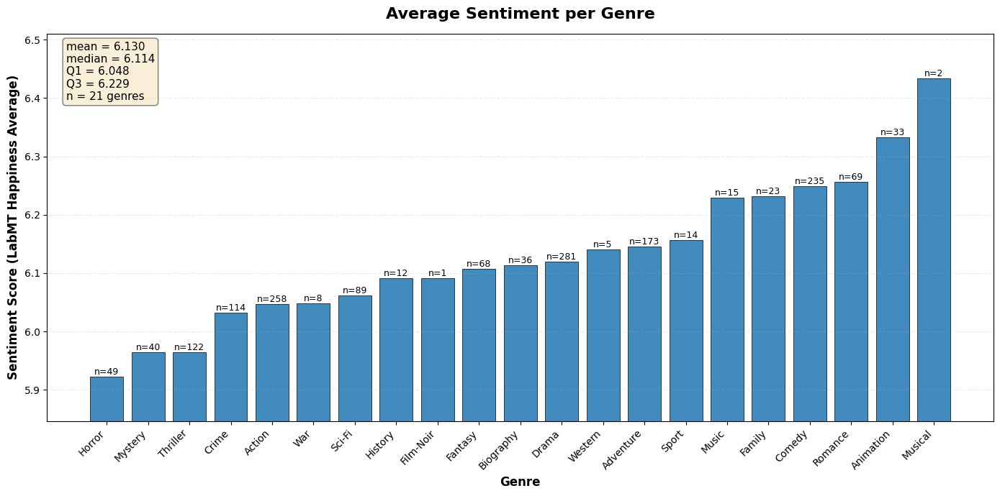

In [ ]:
items = sorted(genre_avg.items(), key=lambda x: x[1])
genres = [g for g, _ in items]
scores = np.array([v for _, v in items])
ns     = [len(genre_scores[g]) for g in genres]

mean, median = float(np.mean(scores)), float(np.median(scores))
p25, p75 = float(np.percentile(scores, 25)), float(np.percentile(scores, 75))

plt.figure(figsize=(14, 7))

x = np.arange(len(genres))
plt.bar(x, scores, edgecolor="black", linewidth=0.6, alpha=0.85)

lo, hi = scores.min(), scores.max()
pad = (hi - lo) * 0.15 if hi > lo else 0.5
plt.ylim(lo - pad, hi + pad)

plt.title("Average Sentiment per Genre", fontsize=16, fontweight="bold", pad=15)
plt.ylabel("Sentiment Score (LabMT Happiness Average)", fontsize=12, fontweight="bold")
plt.xlabel("Genre", fontsize=12, fontweight="bold")

plt.xticks(x, genres, rotation=45, ha="right")

# n labels on bars
for i, (v, n_) in enumerate(zip(scores, ns)):
    plt.text(i, v, f"n={n_}", ha="center", va="bottom", fontsize=9)

# stats box in corner
stats_text = (
    f"mean = {mean:.3f}\n"
    f"median = {median:.3f}\n"
    f"Q1 = {p25:.3f}\n"
    f"Q3 = {p75:.3f}\n"
    f"n = {len(scores)} genres"
)
plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes,
         fontsize=11, va="top",
         bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5))

plt.grid(axis="y", linestyle="--", alpha=0.25)
plt.tight_layout()
plt.show()


### Figure 9: Average Sentiment for each genre. Statistics are shown in the top left corner.

In our analysis, we want to compare if ratings and sentiments correlates in some way. Below we compute Figure 10, that shows how many ratings each genre has.

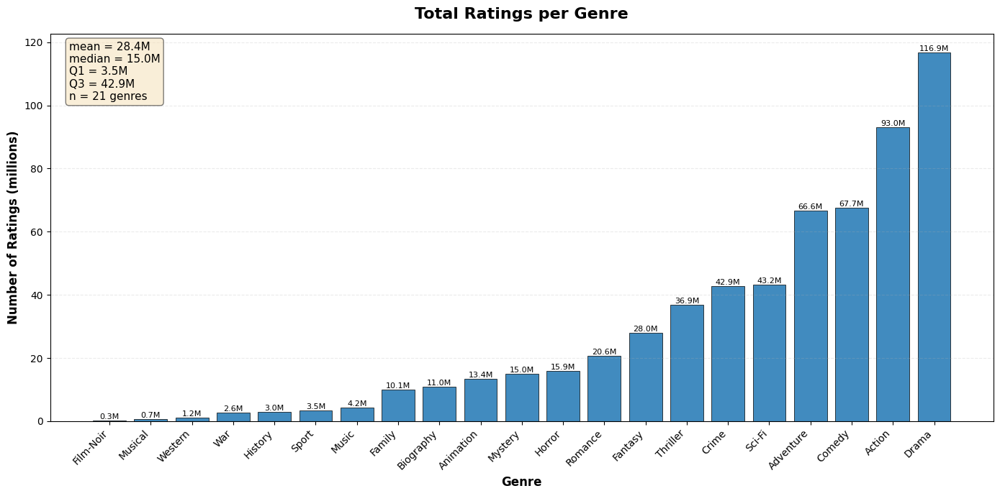

In [ ]:
genre_ratings = defaultdict(int)
for _, d in G.nodes(data=True):
    g = d.get("genre")
    r = d.get("num_ratings")
    if g and r:
        genre_ratings[g] += int(r)

items  = sorted(genre_ratings.items(), key=lambda x: x[1])
genres = [g for g,_ in items]
scores = np.array([v for _,v in items])

#Millions
scores_m = scores / 1e6

mean, median = float(np.mean(scores_m)), float(np.median(scores_m))
p25, p75 = float(np.percentile(scores_m, 25)), float(np.percentile(scores_m, 75))

plt.figure(figsize=(14, 7))

x = np.arange(len(genres))
plt.bar(x, scores_m, edgecolor="black", linewidth=0.6, alpha=0.85)

plt.title("Total Ratings per Genre", fontsize=16, fontweight="bold", pad=15)
plt.ylabel("Number of Ratings (millions)", fontsize=12, fontweight="bold")
plt.xlabel("Genre", fontsize=12, fontweight="bold")

plt.xticks(x, genres, rotation=45, ha="right")

# nicer labels: round to 1 decimal, smaller font, above bar
for i, v in enumerate(scores_m):
    plt.text(i, v, f"{v:.1f}M", ha="center", va="bottom", fontsize=8)

# stats box in millions
stats_text = (
    f"mean = {mean:.1f}M\n"
    f"median = {median:.1f}M\n"
    f"Q1 = {p25:.1f}M\n"
    f"Q3 = {p75:.1f}M\n"
    f"n = {len(scores_m)} genres"
)
plt.text(0.02, 0.98, stats_text, transform=plt.gca().transAxes,
         fontsize=11, va="top",
         bbox=dict(boxstyle="round", facecolor="wheat", alpha=0.5))

plt.grid(axis="y", linestyle="--", alpha=0.25)
plt.tight_layout()
plt.show()


### Figure 10: Total Ratings per genre.